# ЛАБОРАТОРНА РОБОТА №8-9
## Алгоритми дизерингу зображень

In [17]:
import matplotlib.pyplot as plt
import cv2
import numpy as np

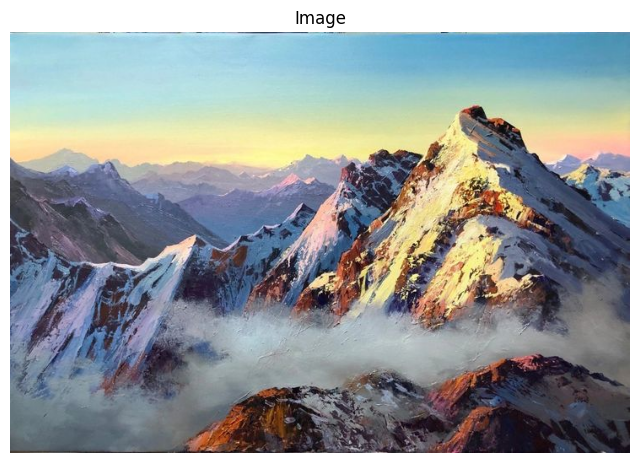

In [18]:
img = cv2.imread("mountain.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(8, 7))
plt.imshow(img)
plt.axis("off")
plt.title("Image")
plt.show()

### 1. Реалізувати програмно упорядкований дизерниг

In [19]:
def dithering(image, dithering_matrix, list_color, center):
    
    img = image.astype(np.float32)
    h, w, c = img.shape
    mh, mw = dithering_matrix.shape
    cy, cx = center
    
    for y in range(h - 1):
        for x in range(1, w - 1):
            for c in range(3):  
                old_pixel = img[y, x, c]
                new_pixel = min(list_color, key=lambda c: abs(c - old_pixel))
                img[y, x, c] = new_pixel
                err = old_pixel - new_pixel

                for dy in range(-cy, mh - cy):
                    for dx in range(-cx, mw - cx):
                        ny, nx = y + dy, x + dx
                        if 0 <= ny < h and 0 <= nx < w:
                            weight = dithering_matrix[dy + cy, dx + cx]
                            img[ny, nx, c] += err * weight

    return np.clip(img, 0, 255).astype(np.uint8)

In [20]:
matrices = {
    "Floyd_Steinberg": {
        "matrix": np.array([
            [0, 0, 0],
            [0, 0, 7],
            [3, 5, 1]
        ]) / 16,
        "center": (1, 1)
    },
    "Jarvis_Giudis_Ninke": {
        "matrix": np.array([
            [0, 0, 0, 7, 5],
            [3, 5, 7, 5, 3],
            [1, 3, 5, 3, 1]
        ]) / 48,
        "center": (0, 2)
    },
    "Peter_Stuck": {
        "matrix": np.array([
            [0, 0, 0, 8, 4],
            [2, 4, 8, 4, 2],
            [1, 2, 4, 2, 1]
        ]) / 48,
        "center": (0, 2)
    },
    "Atkinson": {
        "matrix": np.array([
            [0, 0, 1, 1],
            [1, 1, 1, 0],
            [0, 1, 0, 0]
        ]) / 8,
        "center": (0, 1)
    },
    "Burkes": {
        "matrix": np.array([
            [0, 0, 0, 8, 4],
            [2, 4, 8, 4, 2]
        ]) / 32,
        "center": (0, 2)
    },
    "Sierra": {
        "matrix": np.array([
            [0, 0, 0, 5, 3],
            [2, 4, 5, 4, 2],
            [0, 2, 3, 2, 0]
        ]) / 32,
        "center": (0, 2)
    }
}

In [21]:
results = []
list_color = list(range(0, 256, 64)) + [255] 

for name, config in matrices.items():
    result_img = dithering(img, config["matrix"], list_color, config["center"])
    results.append((name, result_img)) 

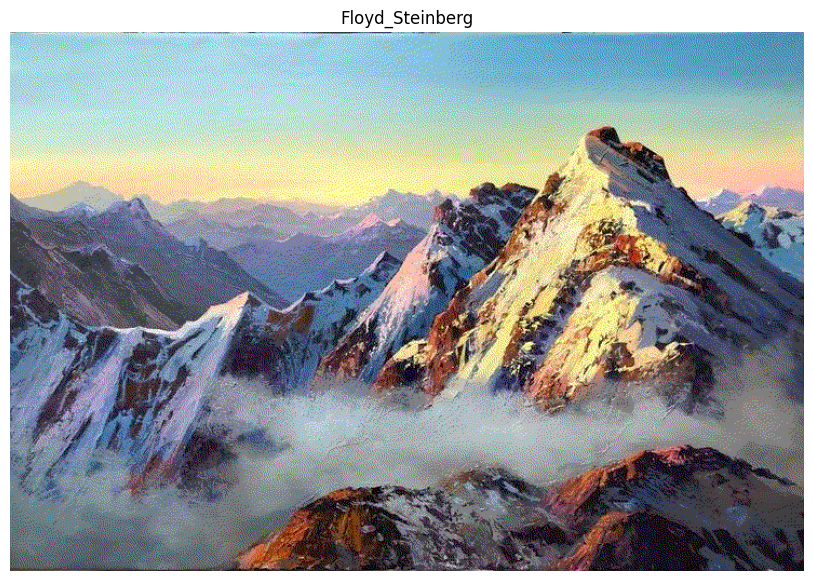

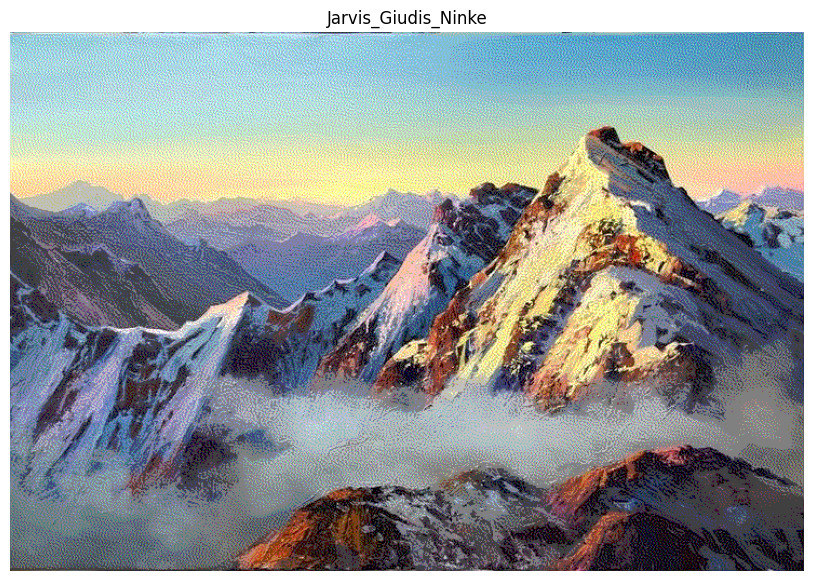

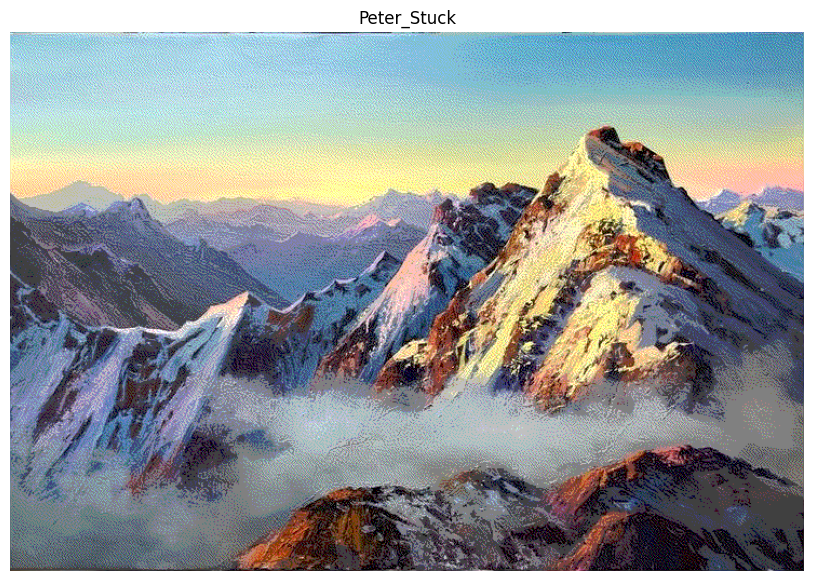

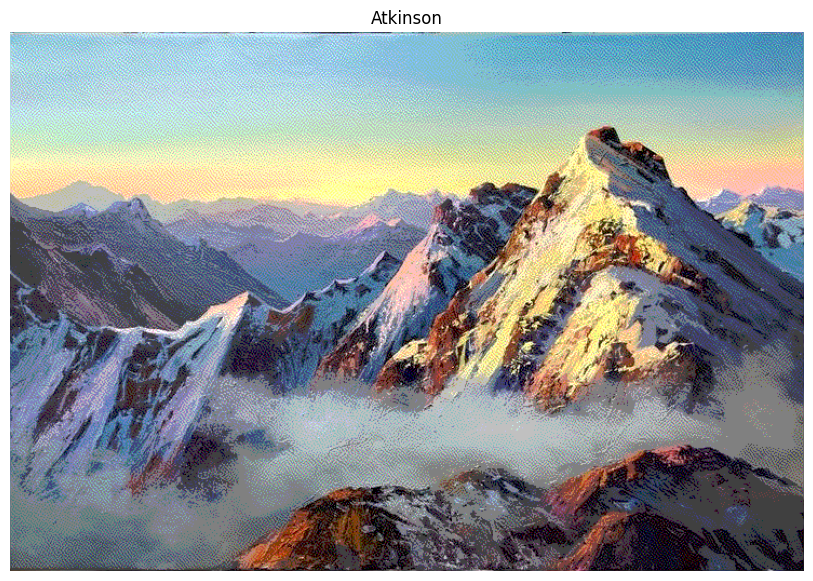

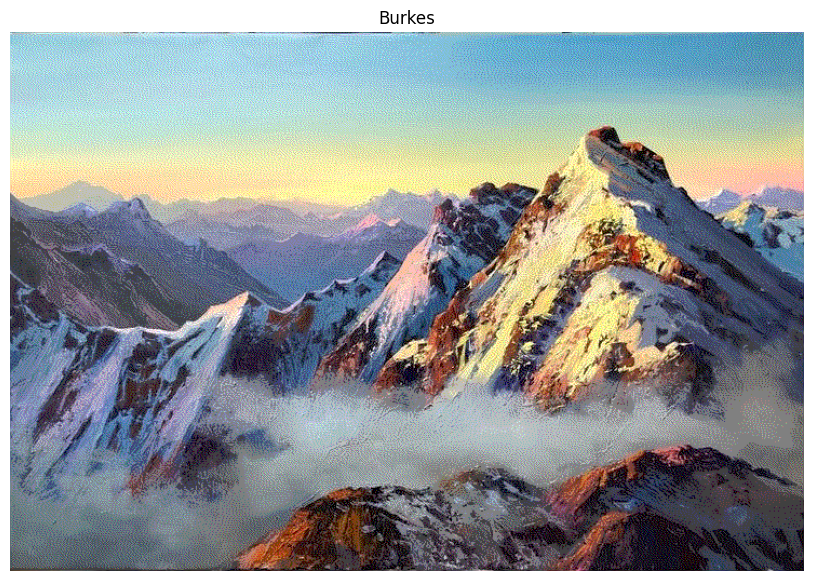

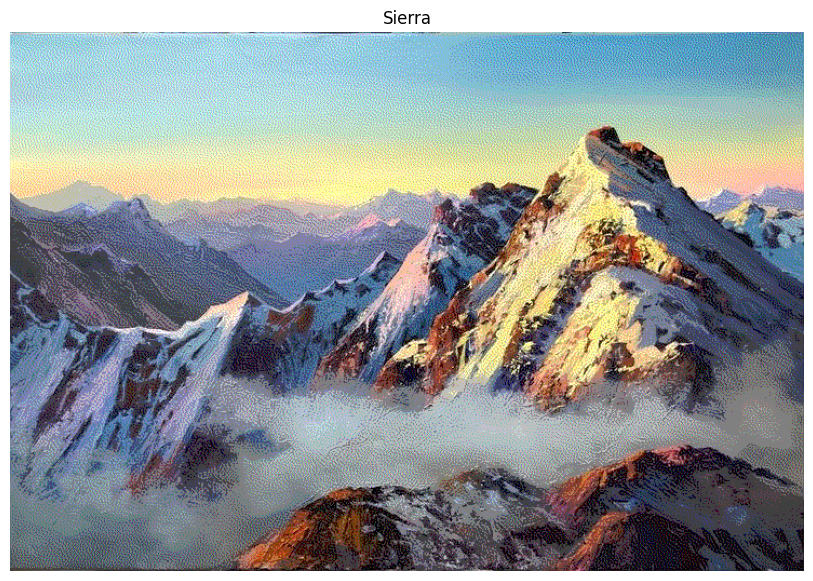

In [22]:
for name, img in results:
    plt.figure(figsize=(14, 7))
    plt.title(name)
    plt.imshow(img)
    plt.axis("off")
    plt.show()

In [23]:
def bayer_dithering(image, bayer_matrix, list_color):
    img = image.astype(np.float32)
    h, w, c = img.shape
    mh, mw = bayer_matrix.shape

    threshold_map = (bayer_matrix + 0.5) / (mh * mw)
    step = 255 / (len(list_color) - 1)

    for y in range(h):
        for x in range(w):
            for ch in range(c):
                
                pixel = img[y, x, ch]
                threshold = threshold_map[y % mh, x % mw] * step
                dithered = pixel + threshold

                new_pixel = min(list_color, key=lambda val: abs(val - dithered))
                img[y, x, ch] = new_pixel

    return np.clip(img, 0, 255).astype(np.uint8)

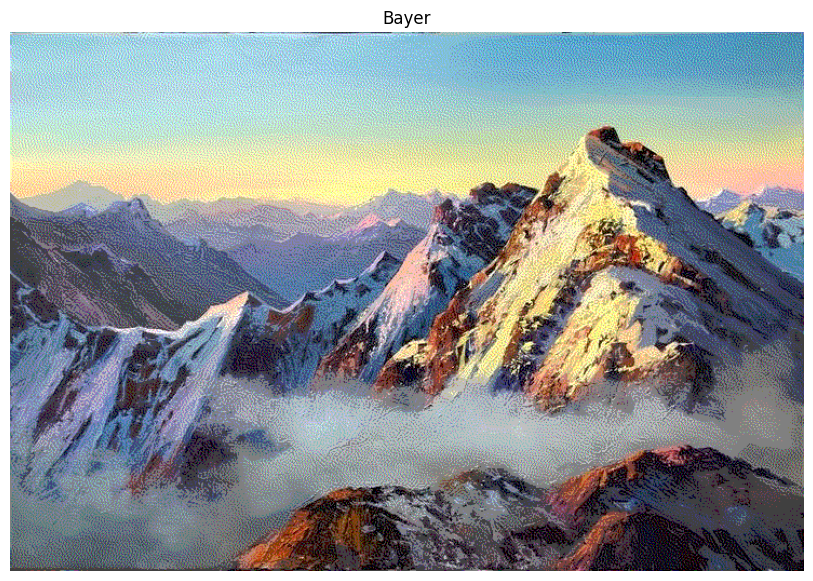

In [24]:
bayer_matrix = np.array([
    [ 0, 32,  8, 40,  2, 34, 10, 42],
    [48, 16, 56, 24, 50, 18, 58, 26],
    [12, 44,  4, 36, 14, 46,  6, 38],
    [60, 28, 52, 20, 62, 30, 54, 22],
    [ 3, 35, 11, 43,  1, 33,  9, 41],
    [51, 19, 59, 27, 49, 17, 57, 25],
    [15, 47,  7, 39, 13, 45,  5, 37],
    [63, 31, 55, 23, 61, 29, 53, 21]
        ]) / 64

list_color = list(range(0, 256, 64)) + [255] 
bayer_img = bayer_dithering(img,bayer_matrix,list_color)

plt.figure(figsize=(14, 7))
plt.title("Bayer")
plt.imshow(bayer_img)
plt.axis("off")
plt.show()

### 2.Реалізувати програмно випадковий дизерниг

In [25]:
def random_dithering(image, list_color, d):
    
    img = image.astype(np.float32).copy()
    h, w = img.shape[:2]
    channels = 1 if img.ndim == 2 else img.shape[2]
    
    for y in range(h):
        for x in range(w):
            for c in range(channels):
                old_val = img[y, x] if channels == 1 else img[y, x, c]
                noise = np.random.uniform(-d, d)
                modified = old_val + noise

                new_val = min(list_color, key=lambda p: abs(p - modified))
                error = modified - new_val

                if channels == 1:
                    img[y, x] = new_val
                else:
                    img[y, x, c] = new_val

                for dx, dy, coeff in [(1, 0, 7/16), (-1, 1, 3/16), (0, 1, 5/16), (1, 1, 1/16)]:
                    nx, ny = x + dx, y + dy
                    if 0 <= nx < w and 0 <= ny < h:
                        if channels == 1:
                            img[ny, nx] += error * coeff
                        else:
                            img[ny, nx, c] += error * coeff

    return np.clip(img, 0, 255).astype(np.uint8)

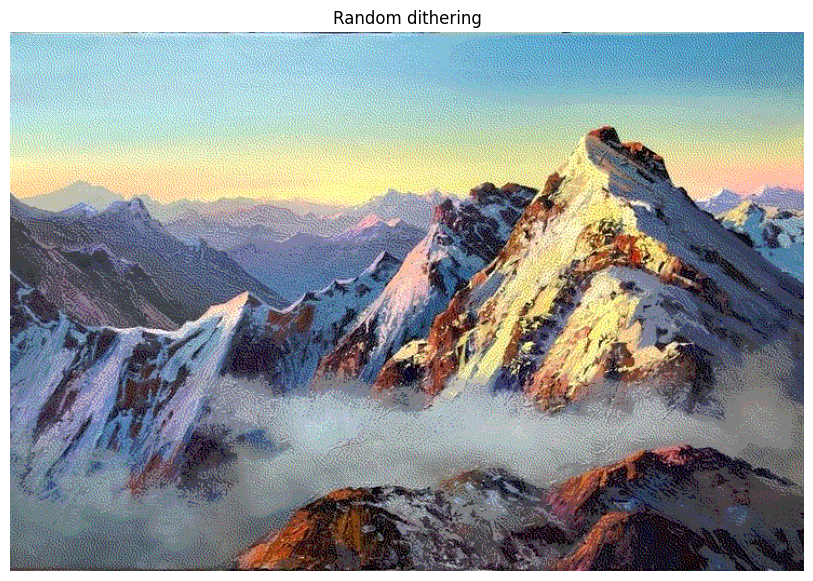

In [26]:
list_color = list(range(0, 256, 64)) + [255] 
dithered_img = random_dithering(img, list_color, 10)

plt.figure(figsize=(14, 7))
plt.title("Random dithering")
plt.imshow(dithered_img)
plt.axis("off")
plt.show()